In [1]:
from scipy.io import wavfile
import scipy.fft as fft


import numpy as np
import math as math

%matplotlib inline
import matplotlib as mpl
mpl.rc('text', usetex = False)
mpl.rc('font', family = 'serif', size = 18)
import matplotlib.pyplot as plt
import scipy.signal as signal
import matplotlib.patches as patches

from scipy.signal import lfilter,resample_poly
import IPython


/home/ignjat/oe3dos/venv/lib/python3.9/site-packages/numpy/_core/getlimits.py:545: UserWarning: Signature b'\x00\xd0\xcc\xcc\xcc\xcc\xcc\xcc\xfb\xbf\x00\x00\x00\x00\x00\x00' for <class 'numpy.longdouble'> does not match any known type: falling back to type probe function.
This warnings indicates broken support for the dtype!
  machar = _get_machar(dtype)


# Zadatak 1

## 1.1

180000


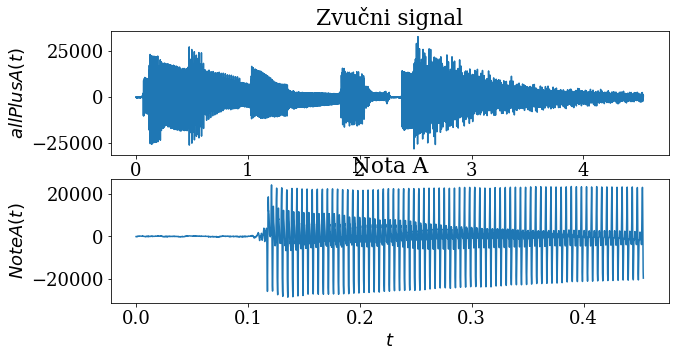

In [2]:
# Ucitavanje potrebnih fajlova
fs, allPlusA = wavfile.read('dz2_signali/allplusA.wav')
fsA, noteA= wavfile.read('dz2_signali/noteA.wav')

#Izracunavanje vremenske ose
tAll = np.arange(len(allPlusA))/fs
tNote= np.arange(len(noteA))/fsA

print(len(allPlusA)-len(noteA))
#Plotovanje signala 
fig, axes = plt.subplots(2, 1,figsize = [10, 5])

axes[0].plot(tAll, allPlusA)
axes[0].set_title("Zvučni signal")
axes[0].set_xlabel(r'$t$');
axes[0].set_ylabel(r'$allPlusA(t)$');

axes[1].plot(tNote, noteA)
axes[1].set_title("Nota A")
axes[1].set_xlabel(r'$t$');
axes[1].set_ylabel(r'$NoteA(t)$');



plt.show()

## 1.2

In [3]:
def bandstop_filter_Cheb2_digital(fs, fa, fp, Aa, Ap):
    wpN = 1
    Ts = 1/fs
    
    fp1, fp2 = fp
    fa1, fa2 = fa
    
    Wa1 = fa1/fs*2*np.pi
    Wp1 = fp1/fs*2*np.pi
    Wp2 = fp2/fs*2*np.pi
    Wa2 = fa2/fs*2*np.pi
    
    wa1 = 2/Ts*math.tan(Wa1/2)
    wp1 = 2/Ts*math.tan(Wp1/2)
    wp2 = 2/Ts*math.tan(Wp2/2)
    wa2 = 2/Ts*math.tan(Wa2/2)
    
    w0 = np.sqrt(wp1*wp2)
    B = (wa2 - wa1)*wpN
    waN = (B*wa1)/(w0**2 - wa1**2)
    
    D = (10**(0.1*Aa)-1)/(10**(0.1*Ap)-1)
    k = wpN/waN
    N = math.ceil(np.arccosh(np.sqrt(D))/np.arccosh(1/k))
    
    z, p, k_cheb = signal.cheb2ap(N, Aa)
    
    an = np.array(np.poly(p))
    bn = k_cheb*np.array(np.poly(z))
    
    if an.shape == ():
        an = np.array([an])
    if bn.shape == ():
        bn = np.array([bn])
    
    b, a = signal.lp2bs(bn, an, w0, B)

    
    # bilinearna transformacija
    bd, ad = signal.bilinear(b, a, fs)
    
    # DIGITALNA FREKVENCIJSKA KARAKTERISTIKA
    wd, Hd = signal.freqz(bd, ad, worN=10000)
    
    return b, a,bd,ad


# PARAMETRI
fs=fs
fa = [435, 447]     # Nepropusni opseg oko 441 Hz (blokira 435-447 Hz)
fp = [400, 482]     # Propusni opseg (ostalo prolazi)
Aa = 40             #Slabljenje od 40 dB
Ap = 1              #Nema sljabljenja
    
b, a,bd,ad = bandstop_filter_Cheb2_digital(fs, fa, fp, Aa, Ap)
w, H = signal.freqs(b, a, worN=10000)
wd, Hd = signal.freqz(bd, ad, worN=1000)
fd = wd * fs / (2 * np.pi)



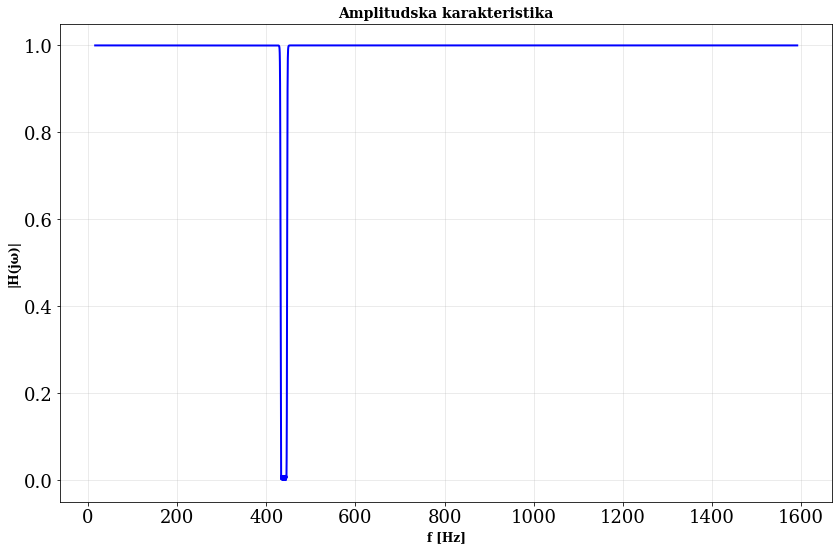

In [4]:

# PLOT
fig, ax = plt.subplots(figsize=(12, 8))

ax.plot(w/2/np.pi, np.abs(H), 'b-', linewidth=2)
ax.set_ylabel('|H(jω)|', fontsize=12, fontweight='bold')
ax.set_xlabel('f [Hz]', fontsize=12, fontweight='bold')
ax.set_title('Amplitudska karakteristika', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)



plt.tight_layout()
plt.show()

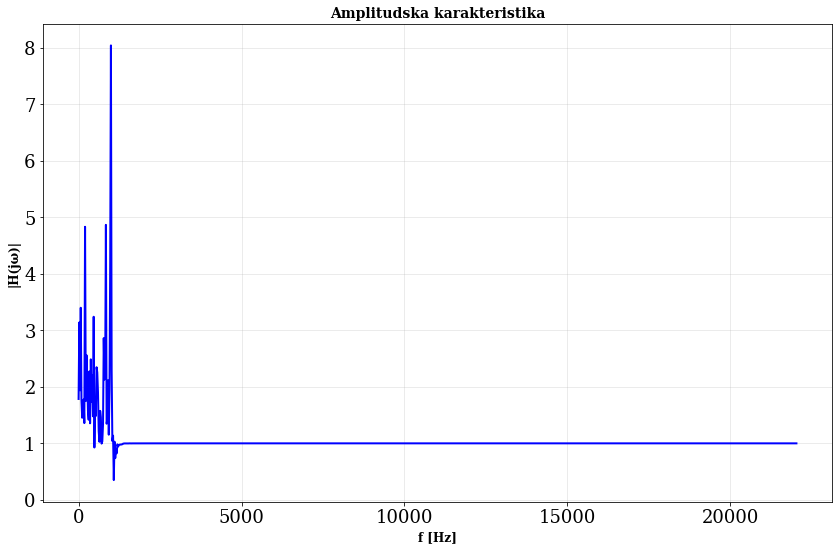

In [5]:

# PLOT
fig, ax = plt.subplots( figsize=(12, 8))

ax.plot(fd, np.abs(Hd), 'b-', linewidth=2)
ax.set_ylabel('|H(jω)|', fontsize=12, fontweight='bold')
ax.set_xlabel('f [Hz]', fontsize=12, fontweight='bold')
ax.set_title('Amplitudska karakteristika', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)



plt.tight_layout()
plt.show()

# Ideja ove tačke bila je da se napravi digitalni filter, klasičnim postupkom pravljenja iir filtara. Sve formule korišćene u gorenavenoj funkciji su već poznate, međutim ova tačka nije do kraja gotova. Naime kada nađem vrednosti razlomka analgonog filtra(b i a), filtar ispada sasvim korektno što se i može videti na prvoj kombinaciji slika. Međutim kada se primeni funkcija signal.bilinear, nastane neki problem sa vrednostima bd i ad, te ne mogu da napravim odgovarajući digiralni filtar nepropusnik opsega, već samo analogni.

## 1.3

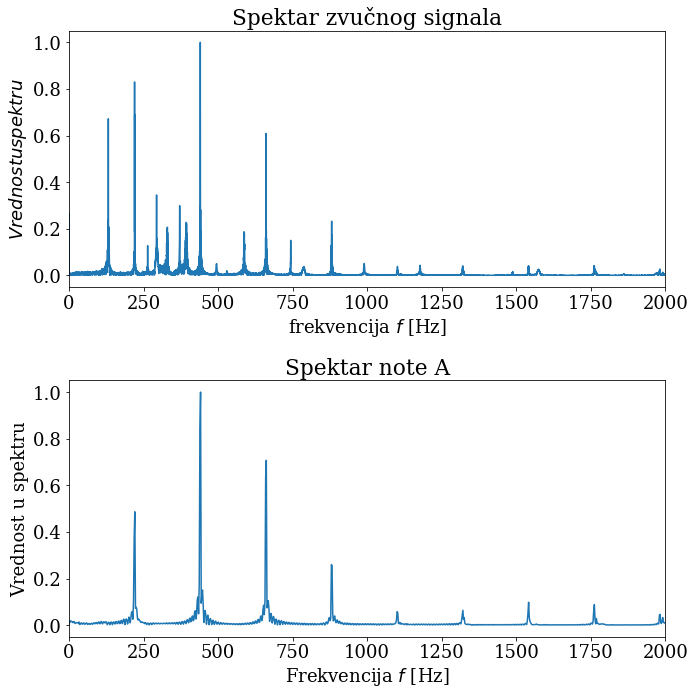

In [6]:
# Amplituda
specNoteA=fft.fftshift(fft.fft(noteA))
specAllPlusA= fft.fftshift(fft.fft(allPlusA))

Nnote=len(specNoteA)
Nall=len(specAllPlusA)

fnote=np.arange(0,fs,fs/Nnote)-fs//2
fall=np.arange(0,fs,fs/Nall)-fs//2


#plotovanje spektra
fig, ax = plt.subplots(2,1,figsize= (10,10))
ax[0].plot(fall, abs(specAllPlusA)/np.max(np.abs(specAllPlusA)))
ax[0].set_title("Spektar zvučnog signala")
ax[0].set_xlim(0,2000)
ax[0].set_xlabel(r'frekvencija $f$ [Hz]')
ax[0].set_ylabel(r'$Vrednost u spektru$');


ax[1].plot(fnote,np.abs(specNoteA)/np.max(np.abs(specNoteA)))
ax[1].set_xlim(0,2000)
ax[1].set_title('Spektar note A')
ax[1].set_xlabel('Frekvencija $f$ [Hz]')
ax[1].set_ylabel('Vrednost u spektru')
plt.tight_layout()
plt.show()

# 1.4 i 1.5
## Zbog problema u tački 1.2 nemoguće je uraditi ove dve tačke međutim ja ću se potruditi da opišem osnovnu ideju rešavanja. Naime pošto na spektru note A vidimo koje su frekvencije dominantne (220 Hz, 441Hz, 661Hz, 882 Hz), korišćenjem našeg iir filtr bilo bi potrebno isfiltrirati stirktno te frekvencije. U tački 1.2 baš zbog toga i stoji filter koji filtrira vrednosti okolne 441 hercu. Nakon filtriranja frekvencija, spektar note a bi bio na svim mestima približan nuli ili imao neznačajne vrednosti, što bi isfiltriralo pesmu od nepotrebnog sviranja preko nje.

# Zadatak 2

# 2.1

In [7]:
#propusnik opsega
def bandpass_filter(fs, fa, fp, Aa, Ap):
    
    # Frekvencije koje koristimo u nasem filtru
    fp1,fp2=fp
    fa1,fa2=fa
    
    Ts=1/fs
    
    # Specifikacije digitalnog filtra
    Wa1 = fa1/fs*2*np.pi
    Wp1 = fp1/fs*2*np.pi
    Wp2 = fp2/fs*2*np.pi
    Wa2 = fa2/fs*2*np.pi

    # Specifikacije analognog prototipa
    wa1 = 2/Ts*math.tan(Wa1/2)
    wp1 = 2/Ts*math.tan(Wp1/2)
    wp2 = 2/Ts*math.tan(Wp2/2)
    wa2 = 2/Ts*math.tan(Wa2/2)

    # Specifikacije normalizovanog NF prototipa
    wpN = 1

    w0 = np.sqrt(wp1*wp2)
    B = (wp2 - wp1)/wpN

    # Pooštravanje specifikacija za wa2 u slučaju da je potrebno
    if (wa1 > w0**2/wa2):
        wa2 = w0**2/wa1

    waN = (wa2**2 - w0**2)/(B*wa2)

    # Normalizovani NF prototip
    D =  (10**(0.1*Aa)-1)/(10**(0.1*Ap)-1)
    k = math.sqrt(1-(wpN/waN)**2)
    q0 = 0.5*(1-math.sqrt(k))/(1+math.sqrt(k))
    q = q0+2*q0**5+15*q0**9+15*q0**13
    N = math.ceil( np.log10(16*D)/np.log10(1/q) )

    z, p, k = signal.ellipap(N, Ap, Aa)

    an = np.array(np.poly(p))
    bn = k*np.array(np.poly(z))
    if an.shape == ():
        an = np.array([an])
    if bn.shape == ():
        bn = np.array([bn])

    #Transformacija ucestanosti
    b, a = signal.lp2bp(bn, an, w0, B);



    # Diskretizacija bilinearnom transformacijom
    [bd, ad] = signal.bilinear(b, a, fs)
    
    return bd,ad




# 2.2

In [8]:
#propusnik opsega
def highpass_filter(fs, fa, fp, Aa, Ap):
    
    Ts=1/fs
    
    # Specifikacije digitalnog filtra
    Wa = fa/fs*2*np.pi
    Wp = fp/fs*2*np.pi

    # Specifikacije analognog prototipa
    wa = 2/Ts*math.tan(Wa/2)
    wp = 2/Ts*math.tan(Wp/2)

    # Specifikacije normalizovanog NF prototipa
    wpN = 1



    waN = wp/wa*wpN

    # Normalizovani NF prototip
    D =  (10**(0.1*Aa)-1)/(10**(0.1*Ap)-1)
    k = math.sqrt(1-(wpN/waN)**2)
    q0 = 0.5*(1-math.sqrt(k))/(1+math.sqrt(k))
    q = q0+2*q0**5+15*q0**9+15*q0**13
    N = math.ceil( np.log10(16*D)/np.log10(1/q) )

    z, p, k = signal.ellipap(N, Ap, Aa)
        
    an = np.array(np.poly(p))
    bn = k*np.array(np.poly(z))
    if an.shape == ():
        an = np.array([an])
    if bn.shape == ():
        bn = np.array([bn])

    #Transformacija ucestanosti
    b, a = signal.lp2hp(bn, an, wp);



    # Diskretizacija bilinearnom transformacijom
    [bd, ad] = signal.bilinear(b, a, fs)
    
    return bd,ad




# 2.3

In [9]:
fs = 44100  
Aa = 60
Ap = 0.05

fp_bp = [8000, 16000]
fa_bp = [7800, 16200]

bd_bp, ad_bp = bandpass_filter(fs, fa_bp, fp_bp, Aa, Ap)

fa_hp = 15800  
fp_hp = 16000

bd_hp, ad_hp = highpass_filter(fs, fa_hp, fp_hp, Aa, Ap)

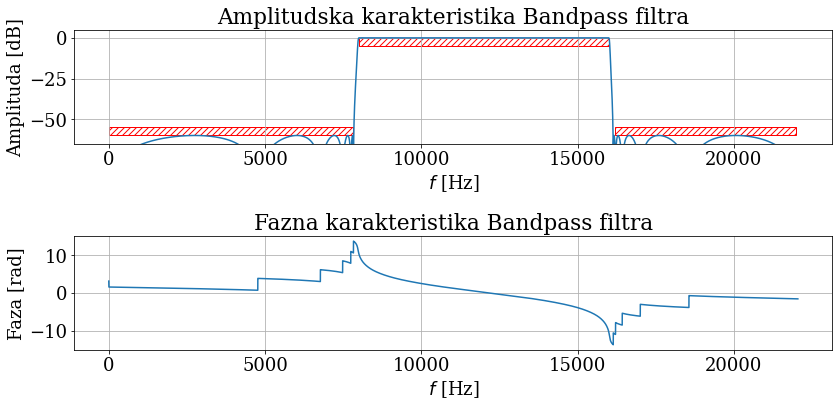

<function matplotlib.pyplot.show(close=None, block=None)>

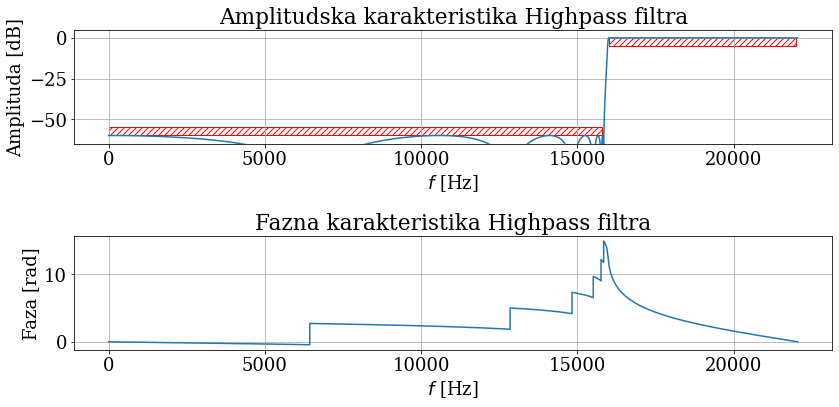

In [10]:
# Frekvencijska karakteristika
w_bp, H_bp = signal.freqs(bd_bp, ad_bp, worN = 10000)
f_bp = w_bp/2/np.pi
fd_bp, Hd_bp = signal.freqz(bd_bp, ad_bp, worN=10000, fs=fs)

# Amplitudska karakteristika
Ha_bp = abs(H_bp)
Hda_bp = abs(Hd_bp)
faza = np.angle(Hd_bp)
faza = np.unwrap(np.angle(Hd_bp))

rXlim = 22000

fig, ax = plt.subplots(2,1, figsize=(12,6))

#crtanje gabarita filtra
# First stop band lim
ax[0].add_patch(patches.Polygon([[0, -Aa ], [fa_bp[0], -Aa], [fa_bp[0], -Aa+5], [0, -Aa+5]], closed=True,
                                  fill=False, hatch='////', color = 'red'))
# Pass band lim
ax[0].add_patch(patches.Polygon([[fp_bp[0], -Ap-5 ], [fp_bp[1], -Ap-5], [fp_bp[1], -Ap], [fp_bp[0], -Ap]], closed=True,
                                  fill=False, hatch='////', color = 'red'))
# Second stop band lim
ax[0].add_patch(patches.Polygon([[fa_bp[1], -Aa ], [rXlim, -Aa], [rXlim, -Aa+5], [fa_bp[1], -Aa+5]], closed=True,
                                  fill=False, hatch='////', color = 'red'))
#plot Bandpass filtra
ax[0].set_title('Amplitudska karakteristika Bandpass filtra')
ax[1].set_title('Fazna karakteristika Bandpass filtra')
ax[0].set_xlabel('$f$ [Hz]')
ax[0].set_ylabel('Amplituda [dB]')
ax[1].set_xlabel('$f$ [Hz]')
ax[1].set_ylabel('Faza [rad]')
ax[0].plot(fd_bp, 20*np.log10(Hda_bp))
ax[1].plot(fd_bp, faza)
ax[0].set_ylim(-65,5)
ax[0].grid()
ax[1].grid()
plt.tight_layout()
plt.show()

# Frekvencijska karakteristika
w_hp, H_hp = signal.freqs(bd_hp, ad_hp, worN = 10000)
f_hp = w_hp/2/np.pi
fd_hp, Hd_hp = signal.freqz(bd_hp, ad_hp, worN=10000, fs=fs)
faza_hp = np.angle(Hd_hp)
faza_hp = np.unwrap(np.angle(Hd_hp))
# Amplitudska karakteristika
Ha_hp = abs(H_hp)
Hda_hp = abs(Hd_hp)
fig, ax = plt.subplots(2,1, figsize=(12,6))
#crtanje gabarita filtra
ax[0].add_patch(patches.Polygon([[0, -Aa ], [fa_hp, -Aa], [fa_hp, -Aa+5], [0, -Aa+5]], closed=True,
                                          fill=False, hatch='////', color = 'red'))
# Pass band lim
ax[0].add_patch(patches.Polygon([[fp_hp, -Ap-5 ], [rXlim, -Ap-5], [rXlim, -Ap], [fp_hp, -Ap]], closed=True,
                                          fill=False, hatch='////', color = 'red'))
#plot Highpass filtra
ax[0].set_title('Amplitudska karakteristika Highpass filtra')
ax[1].set_title('Fazna karakteristika Highpass filtra')
ax[0].set_xlabel('$f$ [Hz]')
ax[0].set_ylabel('Amplituda [dB]')
ax[1].set_xlabel('$f$ [Hz]')
ax[1].set_ylabel('Faza [rad]')
ax[0].plot(fd_hp, 20*np.log10(Hda_hp))
ax[1].plot(fd_hp, faza_hp)
ax[0].set_ylim(-65,5)
ax[0].grid()
ax[1].grid()
plt.tight_layout()
plt.show

## Sa slike možemo videti da isprojektovani filteri ispunjavaju zadate uslove.

In [11]:
def IIR_equalizer(x, fs, style):
    
    # Kreiranje signala razlicitih ucestanosti odabiranja
    
    x1 = x
    #downscaling
    x2 = resample_poly(x,1,2)
    x4 = resample_poly(x,1,4)
    x8 = resample_poly(x,1,8)
    x16 = resample_poly(x,1,16)
    x32 = resample_poly(x,1,32)
    x64 = resample_poly(x,1,64)
    x128 = resample_poly(x,1,128)
    x256 = resample_poly(x,1,256)
    

    #Filteri
    b_bp,a_bp= bandpass_filter(44100, [7800, 16200], [8000, 16000], 60, 0.05)
    b_hp, a_hp = highpass_filter(44100, 15800, 16000, 60, 0.05)
    
    #Kreiranje pojacanja za zadati stil
    if style=='ROCK' :
        amp_profile=[5, 3.75, 3, 1.5, -0.5, -1.5, 1, 2.5, 3.75, 4.5]
    elif style=='POP' :
        amp_profile=[-1.5, -1, 0, 1.5, 4, 4, 2, 0, -1, -1.5]
    elif style=='DANCE':
        amp_profile=[4, 7, 5, 0, 2, 4, 5, 4.5, 3.5, 0]
    elif style=='CUSTOM':
        amp_profile=[6 ,6, 6, 3, 2, 0, 0, -1, -2, -3]
        
    #Prebacivanje pojacanja u decibele
    amp_profile = [10**(db/20) for db in amp_profile]
    
    #Filtriranje
    x1_eq = lfilter( b_bp, a_bp, x256*amp_profile[0]) 
    x2_eq = lfilter( b_bp, a_bp, x128*amp_profile[1])
    x3_eq = lfilter( b_bp, a_bp, x64*amp_profile[2]) 
    x4_eq = lfilter( b_bp, a_bp, x32*amp_profile[3])
    x5_eq = lfilter( b_bp, a_bp, x16*amp_profile[4])
    x6_eq = lfilter( b_bp, a_bp, x8*amp_profile[5])
    x7_eq = lfilter( b_bp, a_bp, x4*amp_profile[6])
    x8_eq = lfilter( b_bp, a_bp, x2*amp_profile[7])
    x9_eq = lfilter( b_bp, a_bp, x1*amp_profile[8])
    x10_eq = lfilter( b_hp, a_hp, x*amp_profile[9])
    
    # Duzina x
    N=len(x)
    
    #Zbir svih signala i upscaling
    y = resample_poly(x1_eq, 256, 1)[:N]  + resample_poly(x2_eq, 128, 1)[:N]  + resample_poly(x3_eq, 64, 1)[:N] + resample_poly(x4_eq, 32, 1)[:N] + resample_poly(x5_eq, 16, 1)[:N] + resample_poly(x6_eq, 8, 1)[:N] + resample_poly(x7_eq, 4, 1)[:N] + resample_poly(x8_eq, 2, 1)[:N] + resample_poly(x9_eq, 1, 1)[:N] + x10_eq[:N]

    return y
    

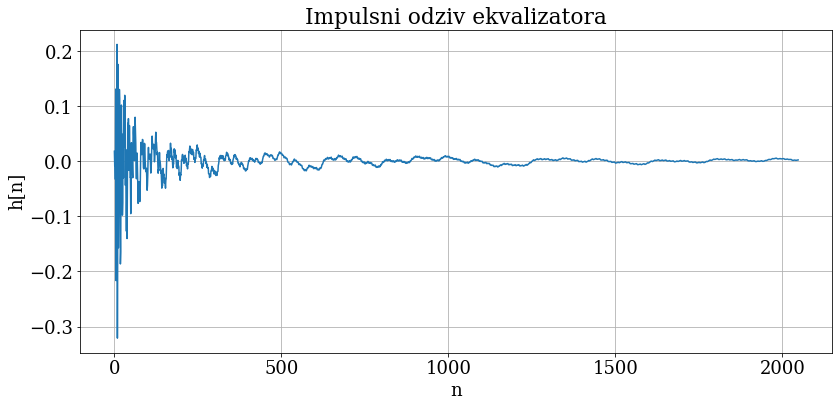

<function matplotlib.pyplot.show(close=None, block=None)>

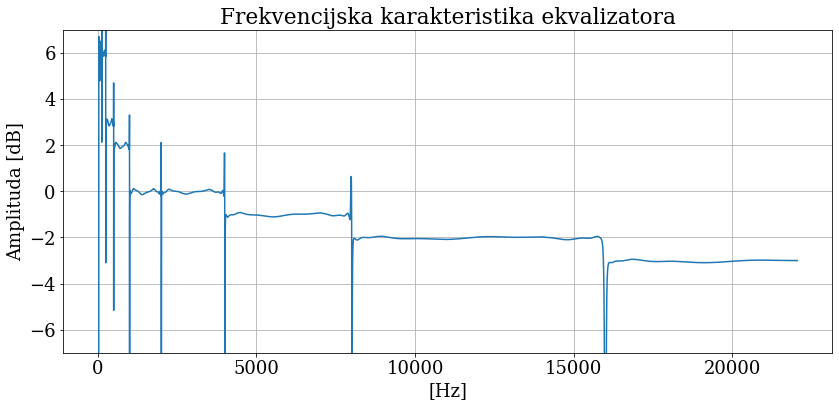

In [12]:
#Kreiramo imuplsni signal
fs=44100
imp = np.zeros(2**16)
imp[0] = 1

# Pozivanje funkcije i generisanje impulsnog odziva
h = IIR_equalizer(imp, fs, 'CUSTOM')

#Plotovanje impulsnog odziva
n=np.arange(len(h))

fig, ax = plt.subplots(figsize = (12,6))
ax.set_title('Impulsni odziv ekvalizatora')
ax.set_ylabel('h[n]')
ax.set_xlabel('n')
ax.plot(n[0:2048],h[:2048]) 
plt.tight_layout()
plt.grid()
plt.show()

H = fft.fft(h)
H_db = 20 * np.log10(np.abs(H) + 1e-6)
f = np.arange(0,fs,fs/(len(H)))

fig, ax = plt.subplots(figsize = (12,6))
ax.set_title('Frekvencijska karakteristika ekvalizatora')
ax.set_ylabel('Amplituda [dB]')
ax.set_xlabel('[Hz]')
ax.set_ylim(-7,7)
ax.plot(f[:len(h)//2], H_db[:len(h)//2])
plt.tight_layout()
plt.grid()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

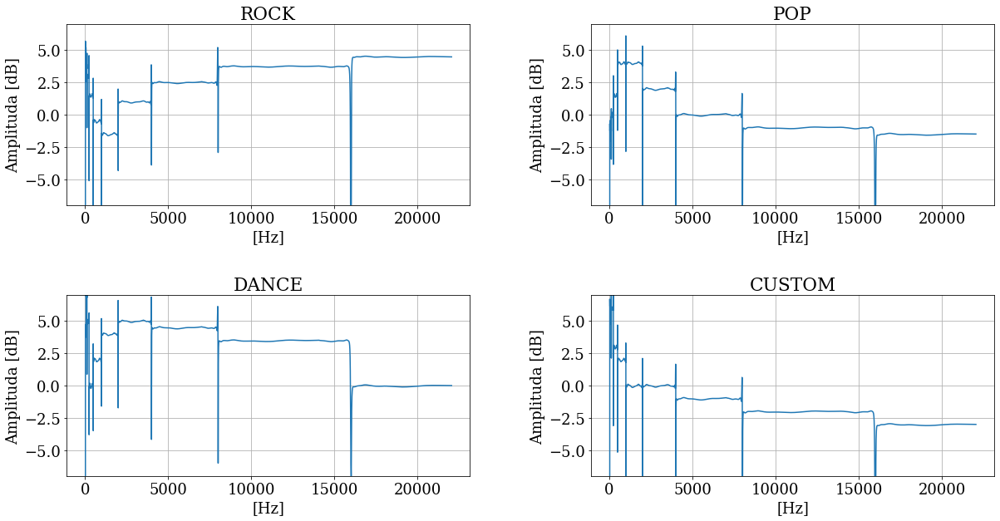

In [13]:
# SIGNAL ROCKA
h_rock=IIR_equalizer(imp, fs, 'ROCK')
H_rock = fft.fft(h_rock)
H_db_rock = 20 * np.log10(np.abs(H_rock) + 1e-6)
f_rock = np.arange(0,fs,fs/(len(H_rock)))

fig, ax = plt.subplots(2,2,figsize = (20,10))
plt.subplots_adjust(hspace=0.5, wspace=0.3)
ax[0,0].set_title('ROCK')
ax[0,0].set_ylabel('Amplituda [dB]')
ax[0,0].set_xlabel('[Hz]')
ax[0,0].set_ylim(-7,7)
ax[0,0].plot(f_rock[:len(h)//2], H_db_rock[:len(h)//2])
ax[0,0].grid()

# SIGNAL POP
h_pop=IIR_equalizer(imp, fs, 'POP')
H_pop = fft.fft(h_pop)
H_db_pop = 20 * np.log10(np.abs(H_pop) + 1e-6)
f_pop = np.arange(0,fs,fs/(len(H_pop)))

ax[0,1].set_title('POP')
ax[0,1].set_ylabel('Amplituda [dB]')
ax[0,1].set_xlabel('[Hz]')
ax[0,1].set_ylim(-7,7)
ax[0,1].plot(f_pop[:len(h)//2], H_db_pop[:len(h)//2])
ax[0,1].grid()

# SIGNAL DANCE
h_dance=IIR_equalizer(imp, fs, 'DANCE')
H_dance = fft.fft(h_dance)
H_db_dance = 20 * np.log10(np.abs(H_dance) + 1e-6)
f_dance = np.arange(0,fs,fs/(len(H_dance)))

ax[1,0].set_title('DANCE')
ax[1,0].set_ylabel('Amplituda [dB]')
ax[1,0].set_xlabel('[Hz]')
ax[1,0].set_ylim(-7,7)
ax[1,0].plot(f_dance[:len(h)//2], H_db_dance[:len(h)//2])
ax[1,0].grid()

# SIGNAL DANCE
h_cst=IIR_equalizer(imp, fs, 'CUSTOM')
H_cst = fft.fft(h_cst)
H_db_cst = 20 * np.log10(np.abs(H_cst) + 1e-6)
f_cst = np.arange(0,fs,fs/(len(H_cst)))

ax[1,1].set_title('CUSTOM')
ax[1,1].set_ylabel('Amplituda [dB]')
ax[1,1].set_xlabel('[Hz]')
ax[1,1].set_ylim(-7,7)
ax[1,1].plot(f_cst[:len(h)//2], H_db_cst[:len(h)//2])
ax[1,1].grid()


plt.show

In [14]:
fs, rock = wavfile.read('dz2_signali/rock.wav')

rock_rock = IIR_equalizer(rock, fs, 'ROCK')
print('Ovo je ROCK ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_rock, rate = fs))
rock_pop = IIR_equalizer(rock, fs, 'POP')
print('Ovo je POP ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_pop, rate = fs))
rock_dance = IIR_equalizer(rock, fs, 'DANCE')
print('Ovo je DANCE ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_dance, rate = fs))
rock_custom = IIR_equalizer(rock, fs, 'CUSTOM')
print('Ovo je CUSTOM ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_custom, rate = fs))

Ovo je ROCK ekvalizacija:


Ovo je POP ekvalizacija:


Ovo je DANCE ekvalizacija:


Ovo je CUSTOM ekvalizacija:


# Zadatak 3

# 3.1

In [15]:
def lowpass_filter_kaiser(Wc, Bt, Aa, Ap):

    # Granicni parametri
    Wp = Wc - Bt/2
    Wa = Wc + Bt/2


    # Delta
    delta_p = (10**(0.05*Ap)-1)/(10**(0.05*Ap)+1)
    delta_a = 10**(-0.05*Aa)

    delta = min([delta_p, delta_a])
    
    # Alpha_a
    if delta < delta_a:
        AaSpec = -20*np.log10(delta)
    else:
        AaSpec = Aa

    # Beta
    beta = 0;
    if AaSpec < 21:
        beta = 0
    elif AaSpec <= 50:
        beta = 0.5842*(AaSpec-21)**0.4 + 0.07886*(AaSpec-21)
    else:
        beta = 0.1102*(AaSpec-8.7)

    # Red filtra
    if AaSpec <= 21:
        D = 0.9222
    else:
        D = (AaSpec-7.95)/14.36
    M = int(np.ceil(2*np.pi*D/Bt + 1))
    N = M - 1

    Norig = N
    
    filterFitsInSpecs = False
    first = True
    
    # Pooštravanje specifikacije kojima se procenjuju parametar β i red filtra, dok oni ne postanu zadovoljeni
    while not filterFitsInSpecs:
        w = signal.windows.kaiser(N+1, beta)

        na = np.arange(-N/2, N/2+1, 1)
        n = np.arange(N+1)

        hID = np.zeros(N+1)
        
        # Pravljenje odziva storgo simetricnim zbog linearnosti faze
        if N % 2 == 0:
            na = np.delete(na, N//2) 
            hID[n != N//2] = np.sin(Wc*na)/(na*np.pi)
            hID[N//2] = Wc/np.pi# lim in na->0
        else:
            hID = np.sin(Wc*na)/(na*np.pi)

        h = hID * w

        numPoints = 1024
        W, H = signal.freqz(h, 1, worN = numPoints)
        Hdb = 20*np.log10(abs(H))

        if first:
            first = False
            HdbOriginal = Hdb

        DeltaW = np.pi/numPoints
        kSB = int(np.ceil(Wa/DeltaW))
        kPB = int(np.floor(Wp/DeltaW))


        if np.all(Hdb[:kPB] > -Ap) and np.all(Hdb[kPB] < Ap) and np.all(Hdb[kSB:]<-Aa):
            filterFitsInSpecs = True
        else:
            N += 1
            
    return h


# 3.2

In [16]:
def dos_resample(x, up_down, r):
    
    #Zadati patametri
    Wc=np.pi/r
    Bt=0.4*np.pi/r
        
        
    Aa=70
    Ap=0.05
        
    h=lowpass_filter_kaiser(Wc, Bt, Aa, Ap) 
    k=len(h)//2
    
    #nema skaliranja
    if r==1:
        x_final=x
    else:
        #decimacija
        if up_down:
            #filtriranje signala Kajzerovom funkcijom
            x_new=lfilter(h,1,x)
            #otklanja kasnjenje 
            x_new=x_new[k:-k]
            #uzima svaki r-ti deo
            x_final=x_new[::r]
        
        #interpolacija prosirivanjem nulama
        else:
            #prosirivanje nulama
            x_new=np.zeros(len(x)*r)
            #uzimanje svakog r-tog elementa
            x_new[::r]=x
            x_filtered=lfilter(h,1,x_new)
            #vracanje snage
            x_final= np.array(x_filtered) * r
            #otklanja kasnjenje
            x_final=x_final[k:-k]
    
    
    return x_final
    
           

        
    

# 3.3

In [17]:
def IIR_equalizer2(x, fs, style):
    
    x1=x
     #downscaling
    x2 = dos_resample(x,True,2)
    x4 = dos_resample(x,True,4)
    x8 = dos_resample(x,True,8)
    x16 = dos_resample(x,True,16)
    x32 = dos_resample(x,True,32)
    x64 = dos_resample(x,True,64)
    x128 = dos_resample(x,True,128)
    x256 = dos_resample(x,True,256)
    

    #Filteri
    b_bp,a_bp= bandpass_filter(fs, [7800, 16200], [8000, 16000], 60, 0.05)
    b_hp, a_hp = highpass_filter(fs, 15800, 16000, 60, 0.05)
    
    #Kreiranje pojacanja za zadati stil
    if style=='ROCK' :
        amp_profile=[5, 3.75, 3, 1.5, -0.5, -1.5, 1, 2.5, 3.75, 4.5]
    elif style=='POP' :
        amp_profile=[-1.5, -1, 0, 1.5, 4, 4, 2, 0, -1, -1.5]
    elif style=='DANCE':
        amp_profile=[4, 7, 5, 0, 2, 4, 5, 4.5, 3.5, 0]
    elif style=='CUSTOM':
        amp_profile=[6 ,6, 6, 3, 2, 0, 0, -1, -2, -3]
        
    #Prebacivanje pojacanja u decibele
    amp_profile = [10**(db/20) for db in amp_profile]
    
    #Filtriranje
    x1_eq = lfilter( b_bp, a_bp, x256*amp_profile[0]) 
    x2_eq = lfilter( b_bp, a_bp, x128*amp_profile[1])
    x3_eq = lfilter( b_bp, a_bp, x64*amp_profile[2]) 
    x4_eq = lfilter( b_bp, a_bp, x32*amp_profile[3])
    x5_eq = lfilter( b_bp, a_bp, x16*amp_profile[4])
    x6_eq = lfilter( b_bp, a_bp, x8*amp_profile[5])
    x7_eq = lfilter( b_bp, a_bp, x4*amp_profile[6])
    x8_eq = lfilter( b_bp, a_bp, x2*amp_profile[7])
    x9_eq = lfilter( b_bp, a_bp, x1*amp_profile[8])
    x10_eq = lfilter( b_hp, a_hp, x*amp_profile[9])
    
    # Duzina x
    N=len(x)
    
    # Ponovno reskaliranje odnosno vracanje
    x_total_eq = np.zeros(N)
    temp = dos_resample(x1_eq, False, 256)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x2_eq, False, 128)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x3_eq, False, 64)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x4_eq, False, 32)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x5_eq, False, 16)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x6_eq, False, 8)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x7_eq, False, 4)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    temp = dos_resample(x8_eq, False, 2)[:N]
    L = min(len(temp),N)
    x_total_eq[:L] +=  temp[:L]
    
    L = min(len(x9_eq), N)
    x_total_eq[:L] += x9_eq[:L]

    L = min(len(x10_eq), N)
    x_total_eq[:L] += x10_eq[:L]
        
    return x_total_eq

    return y

# 3.4 i 3.5

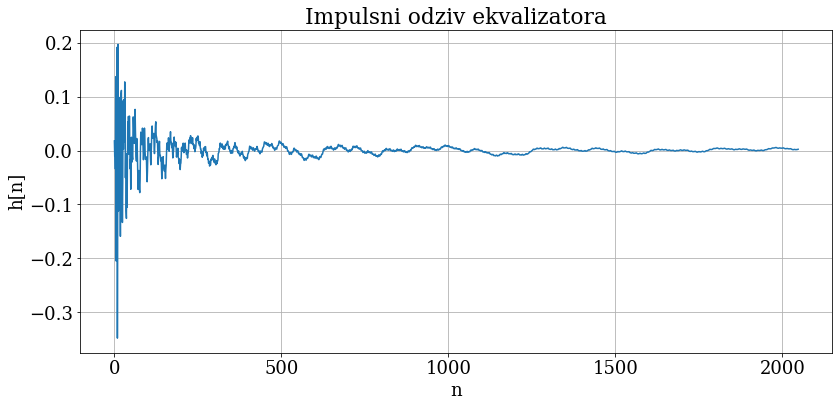

<function matplotlib.pyplot.show(close=None, block=None)>

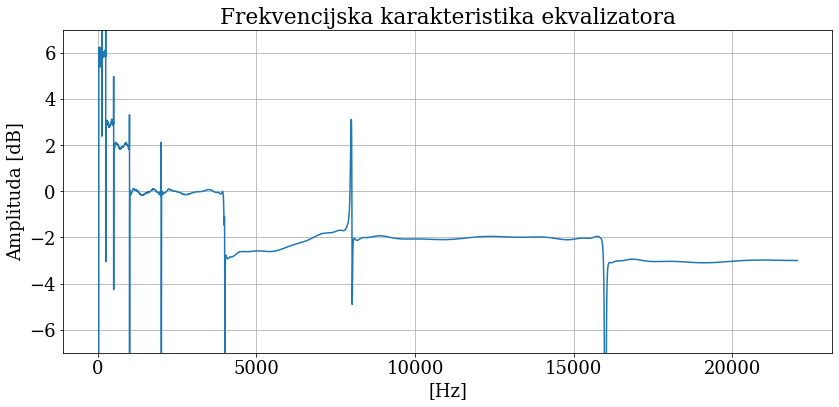

In [18]:
#Kreiramo imuplsni signal
fs=44100
imp = np.zeros(2**16)
imp[0] = 1

# Pozivanje funkcije i generisanje impulsnog odziva
h = IIR_equalizer2(imp, fs, 'CUSTOM')

#Plotovanje impulsnog odziva
n=np.arange(len(h))

fig, ax = plt.subplots(figsize = (12,6))
ax.set_title('Impulsni odziv ekvalizatora')
ax.set_ylabel('h[n]')
ax.set_xlabel('n')
ax.plot(n[0:2048],h[:2048]) 
plt.tight_layout()
plt.grid()
plt.show()

H = fft.fft(h)
H_db = 20 * np.log10(np.abs(H) + 1e-6)
f = np.arange(0,fs,fs/(len(H)))

fig, ax = plt.subplots(figsize = (12,6))
ax.set_title('Frekvencijska karakteristika ekvalizatora')
ax.set_ylabel('Amplituda [dB]')
ax.set_xlabel('[Hz]')
ax.set_ylim(-7,7)
ax.plot(f[:len(h)//2], H_db[:len(h)//2])
plt.tight_layout()
plt.grid()
plt.show

## Dovodjenjem impulsa na ulaz dobijamo poprilicno slicne rezultate kao i sa prvim IIR_equalizerom. Zanimljivo kod ovog filtera je bilo reskaliranje, koje moze vrtiti signal koji je manje duzine od N=len(x). Razlog za to je sto reskaliranje siganla dobijamo mnozenjem 2 cela broja (r i 256,128,64,...).

In [19]:
fs, rock = wavfile.read('dz2_signali/rock.wav')

rock_rock = IIR_equalizer2(rock, fs, 'ROCK')
print('Ovo je ROCK ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_rock, rate = fs))
rock_pop = IIR_equalizer2(rock, fs, 'POP')
print('Ovo je POP ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_pop, rate = fs))
rock_dance = IIR_equalizer2(rock, fs, 'DANCE')
print('Ovo je DANCE ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_dance, rate = fs))
rock_custom = IIR_equalizer2(rock, fs, 'CUSTOM')
print('Ovo je CUSTOM ekvalizacija:')
IPython.display.display(IPython.display.Audio(rock_custom, rate = fs))


Ovo je ROCK ekvalizacija:


Ovo je POP ekvalizacija:


Ovo je DANCE ekvalizacija:


Ovo je CUSTOM ekvalizacija:


## 3.7

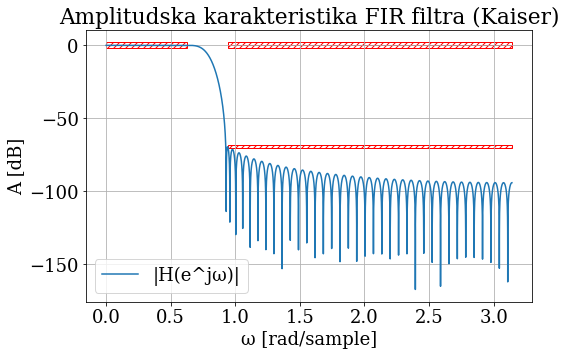

In [20]:
r = 4

Wc = np.pi / r
Bt = 0.4 * np.pi / r

Wp1 = 0
Wp2 = Wc - Bt/2
Wa1 = Wc + Bt/2
Wa2 = np.pi

AaOrig = 70     
Ap = 0.05        


h = lowpass_filter_kaiser(Wc, Bt, AaOrig, Ap)


w, H = signal.freqz(h, worN=20000)

Hdb = 20*np.log10(np.abs(H) + 1e-12)


fig, ax2 = plt.subplots(figsize=(8,5))

ax2.plot(w, Hdb, label='|H(e^jω)|')
ax2.set_xlabel("ω [rad/sample]")
ax2.set_ylabel("A [dB]")
ax2.set_title("Amplitudska karakteristika FIR filtra (Kaiser)")
ax2.grid()


delta_p1 = 10**(Ap/20) - 1
H1 = 1
Ap2 = Ap

ax2.add_patch(mpl.patches.Polygon([[Wa1, -AaOrig], [Wa2, -AaOrig], [Wa2, -AaOrig+2], [Wa1, -AaOrig+2]],closed=True,fill=False,hatch='////',color='red'))
ax2.add_patch(mpl.patches.Polygon([[Wp1, 20*np.log10(H1-delta_p1)-2],[Wp2, 20*np.log10(H1-delta_p1)-2],[Wp2, 20*np.log10(H1-delta_p1)],[Wp1, 20*np.log10(H1-delta_p1)]],closed=True,fill=False,hatch='////',color='red'))
ax2.add_patch(mpl.patches.Polygon([[Wp1, 20*np.log10(H1+delta_p1)],[Wp2, 20*np.log10(H1+delta_p1)],[Wp2, 20*np.log10(H1+delta_p1)+2],[Wp1, 20*np.log10(H1+delta_p1)+2]],closed=True,fill=False,hatch='////',color='red'))

Wp3 = Wa1
Wp4 = np.pi

ax2.add_patch(mpl.patches.Polygon([[Wp3, -Ap2-2], [Wp4, -Ap2-2], [Wp4, -Ap2], [Wp3, -Ap2]], closed=True,fill=False,hatch='////',color='red'))
ax2.add_patch(mpl.patches.Polygon([[Wp3, Ap2], [Wp4, Ap2], [Wp4, Ap2+2], [Wp3, Ap2+2]], closed=True, fill=False,hatch='////',color='red'))

ax2.legend()
plt.show()

In [21]:
def dos_resample_rat(x, p ,q):

    
    fs = 44100
    #Gledamo dominantniji faktor da bi zakljucili da li je decimacija ili interpolacija
    Wc=np.pi/max(p,q)
    Bt=0.4*Wc
    
    #Podaci filtra
    Wp = Wc - Bt/2
    Wa = Wc + Bt/2

    Fp = Wp/2/np.pi
    Fa = Wa/2/np.pi
    
    Ap = 0.05
    Aa = 70
    
    #Red filtra
    dp = (10**(0.05*Ap)-1)/(10**(0.05*Ap)+1)
    da = 10**(-0.05*Aa)
    
    D = (0.005309*np.log10(dp)**2 + 0.07114*np.log10(dp) - 0.4761)*np.log10(da)
    D = D - (0.00266*np.log10(dp)**2 + 0.5941*np.log10(dp) + 0.4278)
    f = 11.01217 + 0.51244*(np.log10(dp) - np.log10(da))
    Bt = Wa-Wp
    M = int(np.ceil(2*np.pi*D/Bt - f*Bt/(2*np.pi) + 1))
    
    # Vektor relativnih ucestanosti za koje se zadaje Hid(w)
    F = [0, Fp, Fa, 0.5]
    # Zeljena idealna amplitudska karakteristika
    Hid = [1, 0]
    # Vektor tezinskih faktora
    Weight = [1, dp/da]
    
    Nfft = 1024
    
    filterFitsInSpecs = False
    #Povecava red filtra ako nisu ispunjeni gabariti
    while not filterFitsInSpecs:
        # Projektovanje filtra
        h = signal.remez(M, F, Hid, weight=Weight)
        W, H = signal.freqz(h, 1, worN = Nfft)
        Ha = abs(H)
        
        DeltaW = np.pi/Nfft
        kSB = int(np.ceil(Wa/DeltaW))
        kPB = int(np.floor(Wp/DeltaW))
        
        if  np.all(Ha[:kPB] > 1 - dp) and np.all(Ha[:kPB] < 1 + dp) and np.all(Ha[kSB:] < da):
            filterFitsInSpecs = True
        else:
            M += 1
    #resample naseg signala (prosirimo ga p puta, potom ga filtriramo, i na kraju ga smanjimo q puta)
    x_uppscaled = np.zeros(len(x) * p)
    x_uppscaled[::p] = x
    x_filt = signal.lfilter(h, 1, x_uppscaled) * p
    k = len(h) // 2
    x_filt = x_filt[k : -k]
    x_final = x_filt[::q]
    
    return x_final

In [22]:
#kreiranje test signala
f1 = 300
f2 = 1500
f3 = 7000
n = np.arange(4056)
test_signal = 5*np.cos(2*np.pi*f1/fs*n) + 3*np.cos(2*np.pi*f2/fs*n) + 0.5*np.cos(2*np.pi*f2/fs*n)
# test za p>q 
signal_resampled1 = dos_resample_rat(test_signal, 5,3)
signal_resampled2 = dos_resample_rat(test_signal, 12, 5)
# test za p<q 
signal_resampled3 = dos_resample_rat(test_signal, 3,5)
signal_resampled4 = dos_resample_rat(test_signal, 5, 12)

<function matplotlib.pyplot.show(close=None, block=None)>

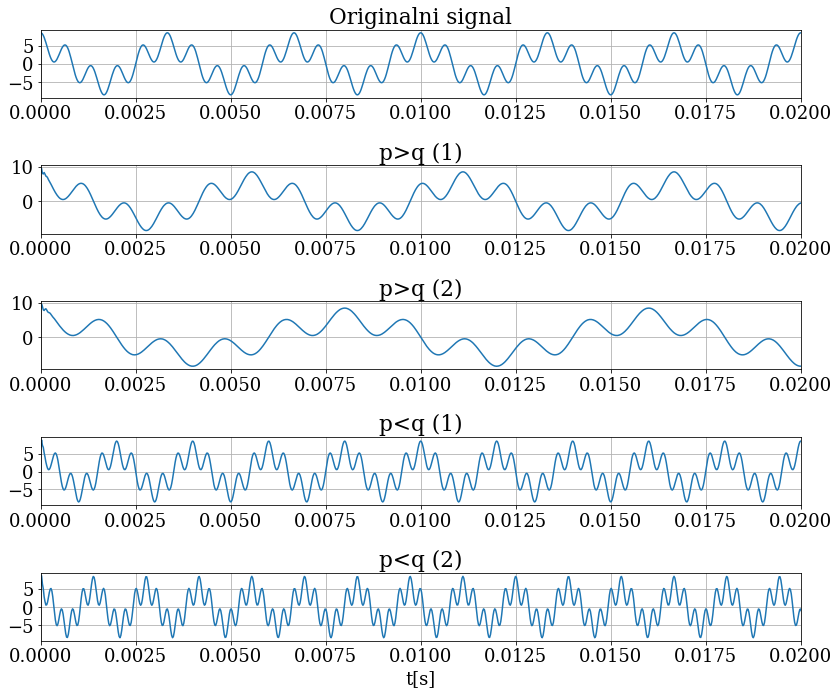

In [23]:
# Plot
fig, ax = plt.subplots(5,1, figsize=(12,10))

ax[0].set_title('Originalni signal')
ax[0].plot(np.arange(len(test_signal))/fs, test_signal)
ax[0].set_xlim(0,0.02)
ax[0].grid()


ax[1].set_title('p>q (1)')
ax[1].plot(np.arange(len(signal_resampled1))/fs, signal_resampled1)
ax[1].set_xlim(0,0.02)
ax[1].grid()


ax[2].set_title('p>q (2)')
ax[2].plot(np.arange(len(signal_resampled2))/fs, signal_resampled2)
ax[2].set_xlim(0,0.02)
ax[2].grid()


ax[3].set_title('p<q (1)')
ax[3].plot(np.arange(len(signal_resampled3))/fs, signal_resampled3)
ax[3].set_xlim(0,0.02)
ax[3].grid()


ax[4].set_title('p<q (2)')
ax[4].plot(np.arange(len(signal_resampled4))/fs, signal_resampled4)
ax[4].set_xlim(0,0.02)
ax[4].set_xlabel('t[s]')
ax[4].grid()


plt.tight_layout()
plt.show